# Search Images by using Embeddings with Florence, OpenAI FAISS and Cognitive Search Vector Store

We will be covering image search with embeddings in this notebook. There are three parts to this notebook:

1. In the first part, we will generate 3 embeddings for each image: image embedding using Florence, text embedding of the image analysis using Florence, and text embedding of the image analysis using OpenAI. We will store the 3 embeddings in the Facebook AI Similarity Search vector store, and we will "benchmark" using a couple of examples how the 3 search methods will compare. 

1. In the second part, we will store the embeddings generated in part 1 in the vector store of Cognitive Search, and we will use URL detection using RegEx and OpenAI to make the search more seamless.

1. Bring Your Own Folder: bring you own image folders and create new FAISS or Cognitive Search indexes

## General Imports and Helper Functions

In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.insert(0, '..')

import os
import matplotlib.pyplot as plt
from PIL import Image
import math
import requests
from io import BytesIO
import plotly.express as px
from sklearn.manifold import TSNE
from dotenv import load_dotenv
import json
from tqdm import tqdm
import faiss
from PIL import Image 
from IPython.display import Image as IImage
import ipywidgets as widgets
import shutil

import azure.ai.vision as sdk
import pandas as pd
import numpy as np
from tenacity import retry, stop_after_attempt, wait_random_exponential

from utils import get_embedding, get_cosine_similarity, get_text_embedding
from utils import get_openai_embedding, analyze_image, save_obj_to_pkl

from utils import show_images, chat_openai



Defining some helper functions here for ease of use:

In [2]:
def dip(path):
    return IImage(path, width=640)


def di(files, index):
    return IImage(filename=os.path.join(image_root,files[index]), width=640)


def dw(files, index):
    f = os.path.join(image_root,files[index])
    image = open(f,'rb').read()
    return widgets.Image(value=image, width=640)

def get_analysis_and_image_embedding(full_path):
    img_embedding = get_embedding(imagefile=full_path)
    analysis_txt  = analyze_image(imagefile=full_path, extended_analysis = True)

    return analysis_txt, img_embedding


def get_analysis_and_embeddings(full_path):
    img_embedding = get_embedding(imagefile=full_path)
    analysis_txt  = analyze_image(imagefile=full_path, extended_analysis = True)
    txt_embedding = get_text_embedding(analysis_txt)
    oai_embedding = get_openai_embedding(analysis_txt)

    return analysis_txt, img_embedding, txt_embedding, oai_embedding

# Part I-A: Search Images by Image Embeddings using FAISS



In [4]:
# Central variables image search:

load_dotenv('../.env')

# Azure Computer Vision
key = os.getenv("azure_cv_key")
endpoint = os.getenv("azure_cv_endpoint")
if endpoint.endswith('/'): endpoint = endpoint[:-1] # remove trailing slash if present

classes = ['men', 'women', 'animals'] # classes to generate 
image_root = './source/' 
image_temp = './tmp' 


files = os.listdir(image_root)

## Create a dataframe of image name, class and embeddings
In the same manner that we did in the "Generate and Search Images" notebook, we are here generating the embddings with Florence and storing them in a dataframe, and then saving the df to a pickle file on the local drive, so that we do not have to re-generate the embeddings every time we run this notebook.

In [23]:
### provide options to select images: either own folder, or sample folder, or generate through SD

def get_image_emb_df(image_root, save_file='emb.pkl'):

    df = pd.DataFrame(columns=['file', 'class', 'cv_image_vector', 'text_en'])
    classes = [x for x in os.walk(image_root)][0][1]
    print(classes)

    idx = 0

    for c in classes:
        files = os.listdir(os.path.join(image_root, c))
        for f in tqdm(files):
            if f.endswith('.png') or f.endswith('.jpg'):
                # print(f"Image file: {file}")
                full_path = os.path.join(image_root, c, f)

                analysis_txt, img_embedding = get_analysis_and_image_embedding(full_path)

                row = [full_path, c, img_embedding, analysis_txt]
                df.loc[idx] = row
                idx += 1

    save_obj_to_pkl(df, save_file)

    print(f"Processed a total of {len(df)} images found in {len(classes)} sub-folders.")  

    return df   


img_df = get_image_emb_df(image_root, save_file='img_emb.pkl')    

In [6]:
def create_faiss_index(df):

    img_emb_arr = np.vstack(df['cv_image_vector'])
    img_path_arr = np.vstack(df['file'])
    img_index = faiss.IndexFlatL2(len(img_emb_arr[0]))
    img_index.add(img_emb_arr)

    return img_index, img_emb_arr, img_path_arr

img_index, img_emb_arr, img_path_arr = create_faiss_index(img_df)    

Now load the search image

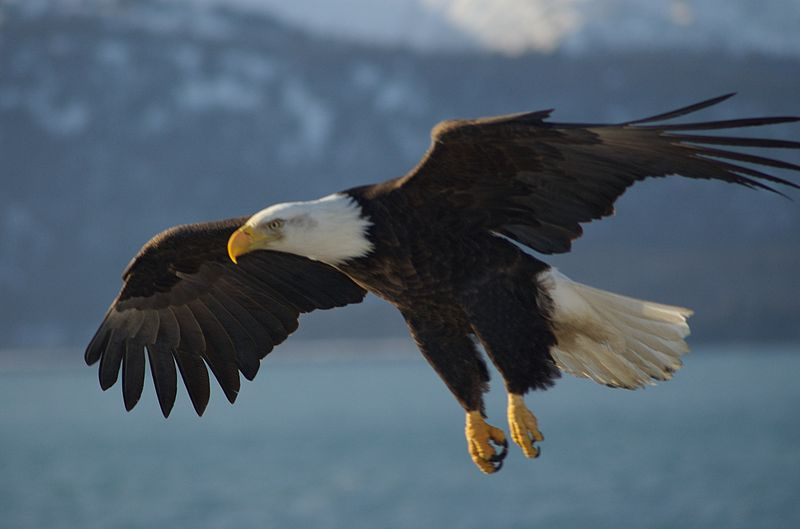

In [11]:
search_image_path = './tmp/Bald Eagle Wikimedia.jpg'
dip(search_image_path)

Let's analyze the search image using Florence, and then calculate the image embeddings.

In [17]:
analysis_txt, img_embedding = get_analysis_and_image_embedding(search_image_path)
analysis_txt

'a bald eagle flying over water, a bald eagle flying in the air, animal, bird, eagle, bird of prey, bald, outdoor, sky, bald eagle, beak, accipitridae, Accipitriformes, wing, falcon, wildlife, mountain, flight, bald eagle'

## Search Function

The below search_simsearch_faiss_index_similar_imagesilar_images() function searches the FAISS Index to find the closest matching images using image embeddings generated by the Florence model. It returns two values, which is the distance values (iD), and the position of these closest matching images inside the FAISS index (iI).

In [18]:
k = 4  # search for k nearest neighbors

def search_faiss_index_similar_images(full_path, img_index=img_index, k=5):    
    
    analysis_txt, img_embedding = get_analysis_and_image_embedding(search_image_path)
    img_embedding_2d = np.expand_dims(img_embedding, axis=0)
    iD, iI = img_index.search(img_embedding_2d, k)

    return iD[0], iI[0]

iD, iI =  search_faiss_index_similar_images(search_image_path, k=k)    

print("Image Search Distances:", iD)



Image Search Distances: [1038.4209 1808.0901 5484.075  5793.4453]


[ 4 12 22  2]
['./source/animals\\Picture157.jpg', './source/animals\\Picture165.jpg', './source/animals\\Picture175.jpg', './source/animals\\Picture155.jpg']


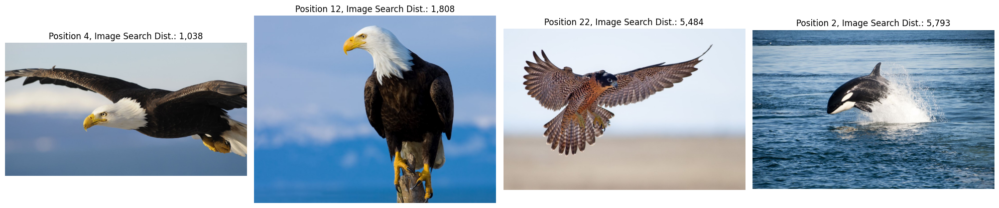

In [22]:
## Calculating the cosine similarity -- not needed as we already get back from FAISS the matching images in order, but just to confirm that the results from FAISS are in the correct order
## and to generate the labels

def visualize_results(distances, positions, embedding, emb_arr, img_path_arr):
    img_cosine = [get_cosine_similarity(embedding, emb_arr[i]) for i in iI]

    ## Generating labels for visualizing image search results
    img_labels = [f"Position {positions[i]}, Image Search Dist.: {distances[i] :,.0f}" for i in range(len(positions))]
    all_scores = np.array([img_labels]).flatten()

    ## Generating image paths for visualizing image search results
    img_indexes = np.array([positions]).flatten()
    imgs = [img_path_arr[i][0] for i in img_indexes]

    print(img_indexes)
    print(imgs)

    ## Showing image search results
    show_images(imgs, cols=k, source='local', savedir='', show_title=True, titles = all_scores)

visualize_results(iD, iI, img_embedding, img_emb_arr, img_path_arr)    

# Part I-B: Search Images by Various Embeddings and Benchmark using FAISS



## Create a dataframe of image name, class and embeddings

__Note__: the Image Embeddings and Text Embeddings in Florence both have vectors of 1,024 dimenstions, and are meant to be interchangeable. Therefore, a Florence text embedding can be used to search an index populated with Florence image embeddings.

In the same manner that we did in the "Generate and Search Images" notebook, we are here generating the embddings with Florence and storing them in a dataframe, and then saving the df to a pickle file on the local drive, so that we do not have to re-generate the embeddings every time we run this notebook.

In [5]:
### provide options to select images: either own folder, or sample folder, or generate through SD

def get_image_df(image_root, save_file='emb.pkl'):

    df = pd.DataFrame(columns=['file', 'class', 'cv_image_vector', 'text_en', 'cv_text_vector', 'aoi_text_vector'])
    classes = [x for x in os.walk(image_root)][0][1]
    print(classes)

    idx = 0

    for c in classes:
        files = os.listdir(os.path.join(image_root, c))
        for f in tqdm(files):
            if f.endswith('.png') or f.endswith('.jpg'):
                # print(f"Image file: {file}")
                full_path = os.path.join(image_root, c, f)

                analysis_txt, img_embedding, txt_embedding, oai_embedding = get_analysis_and_embeddings(full_path)

                row = [full_path, c, img_embedding, analysis_txt, txt_embedding, oai_embedding]
                df.loc[idx] = row
                idx += 1

    save_obj_to_pkl(df, save_file)

    print(f"Processed a total of {len(df)} images found in {len(classes)} sub-folders.")  

    return df   


df = get_image_df(image_root, save_file='emb.pkl')    


['animals', 'men', 'women']


100%|██████████| 50/50 [03:55<00:00,  4.70s/it]

Processed a total of 150 images found in 3 sub-folders.


In [25]:
display(df.sample(3))

,file,class,cv_image_vector,text_en,cv_text_vector,aoi_text_vector
131,./source/women\Picture81.jpg,women,"[0.1373291, -0.93066406, 0.6386719, 2.5996094,...","a woman smiling with a stone wall behind her, ...","[-0.03625765, 0.02173461, 0.032189522, -0.0001...","[-0.005929627455770969, 0.0008407074492424726,..."
25,./source/animals\Picture178.jpg,animals,"[-0.22802734, -0.8378906, 0.25317383, 0.550781...","a yak with snow on its face, a yak covered in ...","[-0.019838326, 0.01635291, -0.0051045674, 0.00...","[-0.028069404885172844, -0.004456880036741495,..."
47,./source/animals\Picture200.jpg,animals,"[-3.2363281, -2.9921875, 1.1416016, -0.46875, ...","a zebras standing in a field, a zebra standing...","[0.0011201585, -0.007323988, 0.029211124, -0.0...","[-0.01927279308438301, -0.0018040230497717857,..."


Restoring the dataframe from the saved pickle file

In [24]:
## Run this cell only if needed
df = pd.read_pickle('emb.pkl')

## Storing the vectors in FAISS 

Storing embedding vectors in FAISS is very straightforward. Create the index first, and then "add" the vectors to the index.

[FAISS](https://github.com/facebookresearch/faiss) uses memory to store the vectors. As defined on GitHub, "FAISS is a library for efficient similarity search and clustering of dense vectors. It contains algorithms that search in sets of vectors of any size, up to ones that possibly do not fit in RAM. It also contains supporting code for evaluation and parameter tuning. Faiss is written in C++ with complete wrappers for Python/numpy. Some of the most useful algorithms are implemented on the GPU. It is developed primarily at Meta's Fundamental AI Research group."

In [26]:
def create_faiss_indexes(df):

    img_emb_arr = np.vstack(df['cv_image_vector'])
    txt_emb_arr = np.vstack(df['cv_text_vector'])
    oai_emb_arr = np.vstack(df['aoi_text_vector'])

    img_path_arr = np.vstack(df['file'])

    img_index = faiss.IndexFlatL2(len(img_emb_arr[0]))
    txt_index = faiss.IndexFlatL2(len(txt_emb_arr[0]))
    oai_index = faiss.IndexFlatL2(len(oai_emb_arr[0]))

    img_index.add(img_emb_arr)
    txt_index.add(txt_emb_arr)
    oai_index.add(oai_emb_arr)

    return img_index, txt_index, oai_index, img_emb_arr, txt_emb_arr, oai_emb_arr, img_path_arr

img_index, txt_index, oai_index, img_emb_arr, txt_emb_arr, oai_emb_arr, img_path_arr = create_faiss_indexes(df)    

## Search Methods

The below search_similar_images() function goes through 3 FAISS Indexes to implement 3 different search methods:

1. The first search method is through image embeddings: we generate the image embeddings with the Florence model, and then we search the vector index for similar images

1. The second search method is through text embeddings with Florence: we analyze first the image using Florence in order to get the captions, dense captions, tags, object detection, etc.. We concatenage all of those fields into a single text document. Then we use this text document to generate the text embeddings using Florence.

1. The third search method is through text embeddings with OpenAI: we use the text document that includes the image analysis as in the previous method, but we generate the text embeddings using OpenAI.

When using these 3 methods side by side, we are trying to compare and "benchmark" those methods. Ideally, you do not need to do this every time, **search through image embeddings should be enough**.

In [27]:
k = 4  # search for k nearest neighbors

def search_faiss_similar_images(full_path, img_index=img_index, txt_index=txt_index, oai_index=oai_index, k=5):    
    
    analysis_txt, img_embedding, txt_embedding, oai_embedding = get_analysis_and_embeddings(search_image_path)

    img_embedding_2d = np.expand_dims(img_embedding, axis=0)
    txt_embedding_2d = np.expand_dims(txt_embedding, axis=0)
    oai_embedding_2d = np.expand_dims(oai_embedding, axis=0)

    iD, iI = img_index.search(img_embedding_2d, k)
    tD, tI = txt_index.search(txt_embedding_2d, k)
    oD, oI = oai_index.search(oai_embedding_2d, k)

    return iD[0], tD[0], oD[0], iI[0], tI[0], oI[0]

iD, tD, oD, iI, tI, oI =  search_faiss_similar_images(search_image_path, k=k)    

print("Image Search Distances:", iD)
print("Text Search Distances:", tD)
print("OpenAI Search Distances:", oD)



Image Search Distances: [1038.4209 1808.0901 5484.075  5793.4453]
Text Search Distances: [0.3953758  0.56360817 0.5954735  0.8356705 ]
OpenAI Search Distances: [0.09115064 0.09612913 0.18017    0.2515288 ]


## Benchmarking the Results

In the below 3 cells we plot the search results. 

1. The first cell represents the images retrieved through search by image embeddings: the results are great, the first two images starting from the left are images of bald eagles, and the third image is that of a falcon. The 4th image is that of an Orca, where most likely the black and white patterns on the head made it "similar" to a bald eagle

1. The second cell represents the images retrieved through search by Florence text embeddings: the results aren't so great. The 2nd image should have been of a bald eagle, but instead the falcon was retrieved.

1. The third cell represents the images retrieved through search by OpenAI text embeddings: the results are great, and almost similar to that of search with image embeddings. This is evidence that the text analysis using Florence model is very accurate and generate very good captions and tags. It's worth noting that the 4th image retrieves an owl, which is closer to a bald eagle than an Orca (at 4th place)

[ 4 12 22  2]
['./source/animals\\Picture157.jpg', './source/animals\\Picture165.jpg', './source/animals\\Picture175.jpg', './source/animals\\Picture155.jpg']


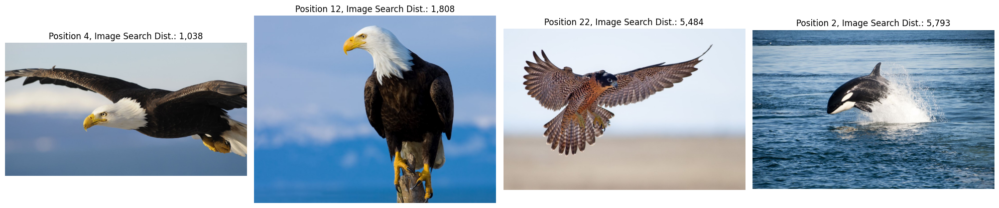

In [28]:
## Now we can visualize the results of the search through Image Embeddings 

visualize_results(iD, iI, img_embedding, img_emb_arr, img_path_arr)    

[ 4 22 12  2]
['./source/animals\\Picture157.jpg', './source/animals\\Picture175.jpg', './source/animals\\Picture165.jpg', './source/animals\\Picture155.jpg']


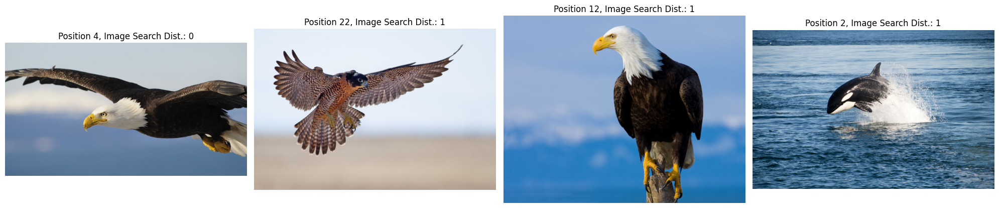

In [30]:
## Now we can visualize the results of the search through Text Embeddings
 
visualize_results(tD, tI, txt_embedding, txt_emb_arr, img_path_arr)    

[ 4 12 22 28]
['./source/animals\\Picture157.jpg', './source/animals\\Picture165.jpg', './source/animals\\Picture175.jpg', './source/animals\\Picture181.jpg']


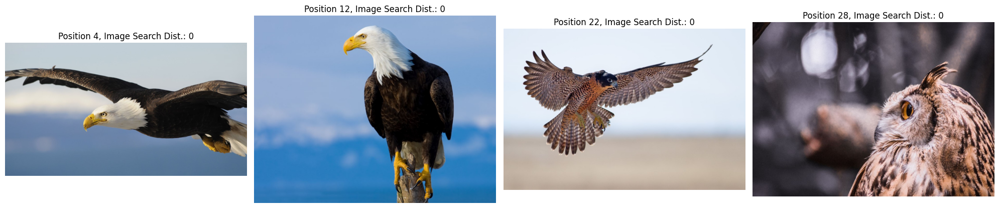

In [32]:
## Now we can visualize the results of the search through OpenAI Embeddings
 
visualize_results(oD, oI, oai_embedding, oai_emb_arr, img_path_arr)    

## Show the plot with the thumbnails of the search image

# Part II: Cognitive Search

__Note:__ This is an optional section since it includes advanced concepts and code.

In this section, we will create a vector store index in Cognitive Search. We will also explore some advanced search techniques that will make image and text search seamless and interchangeable.

First, we create the index in Cognitive Search, and load all embeddings there. The index holds 3 vectors inside each document (please refer to ./cog_search_vec_store/cs_json.py for more information): a vector for OpenAI embeddings "aoi_text_vector", a vector for Florence text embeddings "cv_text_vector", and a vector for Florence image embeddings "cv_image_vector".

The **CogSearchVecStore** class has been developed to interface with Cognitive Search, and provides custom "search" functions, that lets you blend text and image URLs for advanced image search. There are 2 ways to write such as class, either using: the Cognitive Search REST APIs, or the Cognitive Search Python SDK. In this notebook, we have opted for the former. We think that getting familiar with the REST APIs give the user more flexibility when dealing with index uploads, updates, merges, deletes, copies, etc..

![img](../media/cogsearch.png)


In [13]:
from cog_search_vec_store import cogsearch_vecstore


def create_cogsearch_index(df, index_name="img-vec-index"):

    cs_key = os.getenv("COG_SEARCH_ADMIN_KEY")
    cs_endpoint = os.getenv("COG_SEARCH_ENDPOINT")

    cs_vs = cogsearch_vecstore.CogSearchVecStore(cs_key, cs_endpoint, index_name=index_name)

    try:
        cs_vs.delete_index()
    except:
        pass

    cs_vs.create_index()

    docs = df.to_dict('records')

    res = cs_vs.upload_documents(docs)
    return cs_vs, res


cs_vs, res = create_cogsearch_index(df, index_name="img-vec-index")

#### Example II-1: Use of OpenAI Text Embeddings for Image Search

Search through the index using text embeddings: the below function searches through the index for similar images using OpenAI embeddings. If the "vector_name" is not specified, then it uses the "aoi_text_vector" by default.

The CogSearchVecStore.search() function takes the query, generates an OpenAI text embedding for it, and then sends it to Congnitive Search to retrieve most similar results from the "aoi_text_vector" index.

["######\n[./source/animals\\Picture157.jpg] a bald eagle flying in the sky, a bald eagle flying in the sky, a close up of a bird's face, a close-up of a bald eagle, a close up of a bird's feet, a close-up of a bird, a close-up of a bird, animal, bird, bird of prey, eagle, sky, beak, outdoor, bald, accipitridae, bald eagle, wing, Accipitriformes, feather, falcon, harrier, osprey, hawk, wildlife, bird\n######\n", '######\n[./source/animals\\Picture165.jpg] a bald eagle standing on a log, a bald eagle standing on a branch, animal, bird, bird of prey, eagle, outdoor, beak, sky, bald eagle, accipitridae, bald, feather, Accipitriformes, falcon, wildlife, bird\n######\n', "######\n[./source/animals\\Picture181.jpg] an owl looking up to the side, a close up of an owl, a close up of an eye, a close up of a bird's head, a close up of a fur, animal, bird, bird of prey, owl, wildlife, screech owl, beak, outdoor, owl\n######\n", "######\n[./source/animals\\Picture175.jpg] a bird flying in the sky,

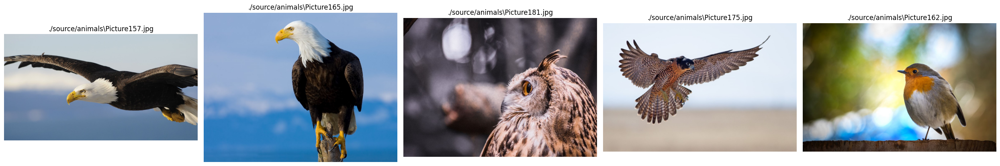

In [14]:
context, links, scores, analysis = cs_vs.search("give me a picture of a bald eagle")
print(context)

show_images(links[:5], cols=5, source='local', savedir='', show_title=True)

#### Example II-2: Use of Florence Text Embeddings for Image Search

Now let's search through the index using Florence text embeddings. The "vector_name" is provided as "cv_text_vector". Now as you can see the results aren't that good at all. It picked up the first image of a bald eagle, but where is the other one?


In this case, the CogSearchVecStore.search() function takes the query, generates a Florence text embedding for it, and then sends it to Congnitive Search to retrieve most similar results from the "cv_text_vector" index.

["######\n[./source/animals\\Picture157.jpg] a bald eagle flying in the sky, a bald eagle flying in the sky, a close up of a bird's face, a close-up of a bald eagle, a close up of a bird's feet, a close-up of a bird, a close-up of a bird, animal, bird, bird of prey, eagle, sky, beak, outdoor, bald, accipitridae, bald eagle, wing, Accipitriformes, feather, falcon, harrier, osprey, hawk, wildlife, bird\n######\n", "######\n[./source/women\\Picture68.jpg] a group of women posing for a picture, a group of women posing for a picture, a woman with her arm around another woman, a woman with long black hair, a woman with a nose ring, a group of women posing for a picture, a group of women posing for a picture, a close up of a person's waist, a close-up of a woman's face, a person wearing a blue shirt, clothing, human face, person, jeans, smile, woman, wall, scarf, sitting, adult, girl, casual dress, happy, posing, person, person, person\n######\n", '######\n[./source/women\\Picture85.jpg] a wo

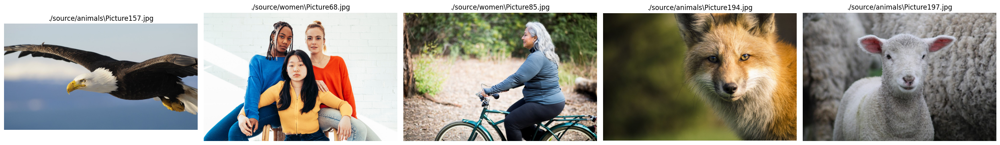

In [15]:
context, links, scores, analysis = cs_vs.search("give me a picture of a bald eagle", vector_name='cv_text_vector')
print(context)

show_images(links[:5], cols=5, source='local', savedir='', show_title=True)

#### Example II-3: Revisited - Use of Florence Text Embeddings for Image Search

If we want to reproduce the same results as before, then the query supplied to Cognitive Search needs to be as close to the image analysis of the image. When it's close, we can see the search results through Florence text embeddings dramatically improve.

This is the analysis of the search image query from Part I: a bald eagle flying over water, a bald eagle flying in the air, animal, bird, eagle, bird of prey, bald, outdoor, sky, bald eagle, beak, accipitridae, Accipitriformes, wing, falcon, wildlife, mountain, flight, bald eagle 

["######\n[./source/animals\\Picture157.jpg] a bald eagle flying in the sky, a bald eagle flying in the sky, a close up of a bird's face, a close-up of a bald eagle, a close up of a bird's feet, a close-up of a bird, a close-up of a bird, animal, bird, bird of prey, eagle, sky, beak, outdoor, bald, accipitridae, bald eagle, wing, Accipitriformes, feather, falcon, harrier, osprey, hawk, wildlife, bird\n######\n", "######\n[./source/animals\\Picture175.jpg] a bird flying in the sky, a bird flying in the sky, a close-up of a bird's wing, a close-up of a bird wing, a close up of a bird, a close-up of a bird, a close-up of a feather, a bird flying in the sky, animal, bird, wildlife, outdoor, bird of prey, falcon,

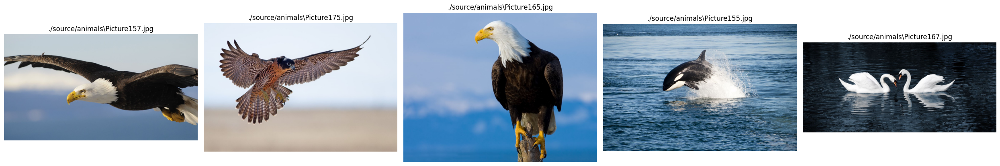

In [16]:
print("This is the analysis of the search image query from Part I:", analysis_txt, '\n')

context, links, scores, analysis = cs_vs.search(analysis_txt, vector_name='cv_text_vector')
print(context)

show_images(links[:5], cols=5, source='local', savedir='', show_title=True)


#### Example II-4: Use of Florence Image Analysis for Image Search

The search function has been developed to recognize image URLs through RegEx, and then automatically generate image analysis (Captions, Tags, etc..) with Florence. Once the analysis is generated, then the text is used to generate OpenAI embeddings (since we did not specify the vector name below, then "aoi_text_vector" is used by default) and use this embedding to search for closest images. This is very similar to example II-1, except that the image URL that we supplied will be the source of the text to search.

["Analysis of the image in the question: get me similar images \n[https://cdn.britannica.com/37/151937-050-FE5C6DC7/Bald-eagles-Homer-Alaska.jpg] This is an image. Main Caption: a bald eagle flying over a body of water\nOCR: \nDense Captions: a bald eagle flying over a body of water, a bald eagle flying in the sky, a bald eagle with a white head, a close-up of a bird's head, a white bird with a blue background\nTags: animal, bird, bird of prey, eagle, sky, beak, outdoor, bald, bald eagle, accipitridae, feather, wing, Accipitriformes, falcon, water, wildlife\n\n", "######\n[./source/animals\\Picture157.jpg] a bald eagle flying in the sky, a bald eagle flying in the sky, a close up of a bird's face, a close-up of a bald eagle, a close up of a bird's feet, a close-up of a bird, a close-up of a bird, animal, bird, bird of prey, eagle, sky, beak, outdoor, bald, accipitridae, bald eagle, wing, Accipitriformes, feather, falcon, harrier, osprey, hawk, wildlife, bird\n######\n", '######\n[./sou

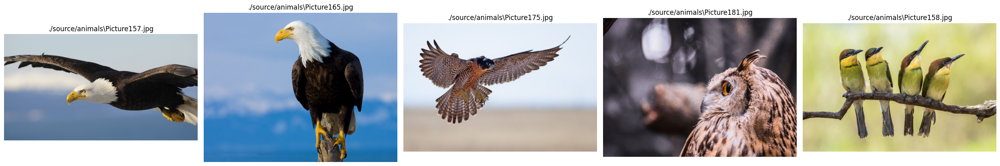

In [17]:
context, links, scores, analysis = cs_vs.search("get me similar images https://cdn.britannica.com/37/151937-050-FE5C6DC7/Bald-eagles-Homer-Alaska.jpg")

print(context)

show_images(links[:5], cols=5, source='local', savedir='', show_title=True)

#### Example II-5A: Use of Florence Image Embeddings for Image Search

Below we are now using a new search function called "search_similar_images". This new function now takes an image URL (for now, it ignores the rest of the text in the query), generates image embeddings use Florence, and then searches the "cv_image_vector" index in Cognitive Search.

["######\n[./source/animals\\Picture157.jpg] a bald eagle flying in the sky, a bald eagle flying in the sky, a close up of a bird's face, a close-up of a bald eagle, a close up of a bird's feet, a close-up of a bird, a close-up of a bird, animal, bird, bird of prey, eagle, sky, beak, outdoor, bald, accipitridae, bald eagle, wing, Accipitriformes, feather, falcon, harrier, osprey, hawk, wildlife, bird\n######\n", '######\n[./source/animals\\Picture165.jpg] a bald eagle standing on a log, a bald eagle standing on a branch, animal, bird, bird of prey, eagle, outdoor, beak, sky, bald eagle, accipitridae, bald, feather, Accipitriformes, falcon, wildlife, bird\n######\n', "######\n[./source/animals\\Picture175.jpg] a bird flying in the sky, a bird flying in the sky, a close-up of a bird's wing, a close-up of a bird wing, a close up of a bird, a close-up of a bird, a close-up of a feather, a bird flying in the sky, animal, bird, wildlife, outdoor, bird of prey, falcon, beak, hawk, wing, feath

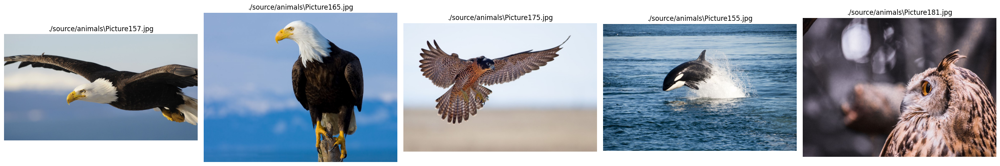

In [18]:
query = "get me similar images https://www.allaboutbirds.org/guide/assets/photo/306062281-480px.jpg"
context, links, scores, analysis = cs_vs.search_similar_images(query)

print(context)

show_images(links[:5], cols=5, source='local', savedir='', show_title=True)

#### Example II-5B: (Optional) Use of OpenAI to Further Filter the Search Results

Now that we got the results from II-5A, let's use OpenAI to filter out all the irrelevant results that have been returned in the top 5 results by Cognitive Search. 

We ask OpenAI in the prompt to look at the image analysis (in addition to the query), and then compare this with the returned results to filter out the non-relevant results.

In [19]:

prompt = f"""Assistant is a large language model trained by OpenAI and is super factual and details oriented. 
The assistant must answer the Question, and must look for answers within the provided Context below, both delineated by 3 backticks.

```
Context: {' '.join(context)}
```

```
Question: from the Context above, please return the search results and the source links that are most relevant to the following query: {query + ' ' + analysis_txt}
```

Answer:
"""

print(chat_openai(prompt, 'gpt-4', max_output_tokens = 1000))

The most relevant search results from the context for a bald eagle flying over water or in the air are:

1. [./source/animals\Picture157.jpg] a bald eagle flying in the sky, a bald eagle flying in the sky, a close up of a bird's face, a close-up of a bald eagle, a close up of a bird's feet, a close-up of a bird, a close-up of a bird, animal, bird, bird of prey, eagle, sky, beak, outdoor, bald, accipitridae, bald eagle, wing, Accipitriformes, feather, falcon, harrier, osprey, hawk, wildlife, bird

2. [./source/animals\Picture165.jpg] a bald eagle standing on a log, a bald eagle standing on a branch, animal, bird, bird of prey, eagle, outdoor, beak, sky, bald eagle, accipitridae, bald, feather, Accipitriformes, falcon, wildlife, bird


# Part III - Bring Your Own Folder

Supply the path to your image folder below, and let this notebook do the work.

__Note__: Please note that the folder hierarchy **MUST** be the same as the "source" folder. Your folder should have at least 1 sub-directory, and each sub-directory cannot have any further sub-directories under it (shallow tree with level 1). The images will be stored in the sub-directories, and not under the root folder. 

In [ ]:
## Change this to match the name of your folder, keep in mind of the folder structure that needs to be similar to ./source
my_folder = '../new_imgs' 

## Create the new dataframe
my_df = get_image_df(my_folder, save_file='my_emb.pkl')    

## Create the FAISS Indexes
img_index, txt_index, oai_index, img_emb_arr, txt_emb_arr, oai_emb_arr, img_path_arr = create_faiss_indexes(my_df)  

## Search with image path
iD, tD, oD, iI, tI, oI = search_faiss_similar_images(search_image_path, img_index=img_index, txt_index=txt_index, oai_index=oai_index, k=1)

## visualize results
visualize_results(iD, tD, oD, iI, tI, oI, img_embedding, txt_embedding, oai_embedding, img_path_arr)    

## Create the COG Search Index
cs_vs, res = create_cogsearch_index(my_df, index_name="my-img-vec-index")

## Search with image text
context, links, scores, analysis = cs_vs.search("give me a picture of a bald eagle")

## visualize results
show_images(links[:1], cols=1, source='local', savedir='', show_title=True)